# US EPA Air Quality System API
This notebook requests data from the US Environmental Protection Agency (EPA) Air Quality Service (AQS) API. This is a historical API and does not provide real-time air quality data. The [documentation](https://aqs.epa.gov/aqsweb/documents/data_api.html) for the API provides definitions of the different call parameter and examples of the various calls that can be made to the API. This notebook request the data by first requesting an API key, get various IDs and parameter values, and using 'daily summary' to get summary data that meets specific condistions. 

The US EPA was created in the early 1970's. The EPA reports that they only started broad based monitoring with standardized quality assurance procedures in the 1980's. Many counties will have data starting somewhere between 1983 and 1988. However, some counties still do not have any air quality monitoring stations. The API helps resolve this by providing calls to search for monitoring stations and data using either station ids, or a county designation or a geographic bounding box. This example code provides examples of the county based and bounding box based API calls. Some [additional information on the Air Quality System can be found in the EPA FAQ](https://www.epa.gov/outdoor-air-quality-data/frequent-questions-about-airdata) on the system.

The end goal of this example is to get to some values that we might use for the Air Quality Index or AQI. You might see this reported on the news, most often around smog, but more frequently with regard to smoke. The AQI index is meant to tell us something about how healthy or clean the air is on any day. The AQI is actually a somewhat complext measure. When I started this example I looked up [how to calculate the AQI](https://www.airnow.gov/sites/default/files/2020-05/aqi-technical-assistance-document-sept2018.pdf) so that I would know roughly what goes into that value.


## License
Some of this code was developed by Dr. David W. McDonald for use in DATA 512, a course in the UW MS Data Science degree program. This code is provided under the [Creative Commons](https://creativecommons.org) [CC-BY license](https://creativecommons.org/licenses/by/4.0/). Revision 1.2 - August 16, 2024



In [80]:
# 
#    These are standard python modules
#
#import json, time, urllib.parse
import json, time
#
#    The 'requests' module is a distribution module for making web requests. If you do not have it already, you'll need to install it
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
#########
#
#    CONSTANTS
#

#
#    This is the root of all AQS API URLs
#
API_REQUEST_URL = 'https://aqs.epa.gov/data/api'

#
#    These are some of the 'actions' we can ask the API to take or requests that we can make of the API
#
#    Sign-up request - generally only performed once - unless you lose your key
API_ACTION_SIGNUP = '/signup?email={email}'
#
#    List actions provide information on API parameter values that are required by some other actions/requests
API_ACTION_LIST_CLASSES = '/list/classes?email={email}&key={key}'
API_ACTION_LIST_PARAMS = '/list/parametersByClass?email={email}&key={key}&pc={pclass}'
API_ACTION_LIST_SITES = '/list/sitesByCounty?email={email}&key={key}&state={state}&county={county}'
#
#    Monitor actions are requests for monitoring stations that meet specific criteria
API_ACTION_MONITORS_COUNTY = '/monitors/byCounty?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&state={state}&county={county}'
API_ACTION_MONITORS_BOX = '/monitors/byBox?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&minlat={minlat}&maxlat={maxlat}&minlon={minlon}&maxlon={maxlon}'
#
#    Summary actions are requests for summary data. These are for daily summaries
API_ACTION_DAILY_SUMMARY_COUNTY = '/dailyData/byCounty?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&state={state}&county={county}'
API_ACTION_DAILY_SUMMARY_BOX = '/dailyData/byBox?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&minlat={minlat}&maxlat={maxlat}&minlon={minlon}&maxlon={maxlon}'
#
#    It is always nice to be respectful of a free data resource.
#    We're going to observe a 100 requests per minute limit - which is fairly nice
API_LATENCY_ASSUMED = 0.002       # Assuming roughly 2ms latency on the API and network
API_THROTTLE_WAIT = (1.0/100.0)-API_LATENCY_ASSUMED
#
#
#    This is a template that covers most of the parameters for the actions we might take, from the set of actions
#    above. In the examples below, most of the time parameters can either be supplied as individual values to a
#    function - or they can be set in a copy of the template and passed in with the template.
# 
AQS_REQUEST_TEMPLATE = {
    "email":      "",     
    "key":        "",      
    "state":      "",     # the two digit state FIPS # as a string
    "county":     "",     # the three digit county FIPS # as a string
    "begin_date": "",     # the start of a time window in YYYYMMDD format
    "end_date":   "",     # the end of a time window in YYYYMMDD format, begin_date and end_date must be in the same year
    "minlat":    0.0,
    "maxlat":    0.0,
    "minlon":    0.0,
    "maxlon":    0.0,
    "param":     "",     # a list of comma separated 5 digit codes, max 5 codes requested
    "pclass":    ""      # parameter class is only used by the List calls
}



### Making a sign-up request

Before you can use the API you need to request a key. You will use an email address to make the request. The EPA then sends a confirmation email link and a 'key' that you use for all other requests.

You only need to sign-up once, unless you want to invalidate your current key (by getting a new key) or you lose your key.


In [3]:
#
#    This implements the sign-up request. The parameters are standardized so that this function definition matches
#    all of the others. However, the easiest way to call this is to simply call this function with your preferred
#    email address.
#
def request_signup(email_address = None,
                   endpoint_url = API_REQUEST_URL, 
                   endpoint_action = API_ACTION_SIGNUP, 
                   request_template = AQS_REQUEST_TEMPLATE,
                   headers = None):
    
    # Make sure we have a string - if you don't have access to this email addres, things might go badly for you
    if email_address:
        request_template['email'] = email_address        
    
    if not request_template['email']: 
        raise Exception("Must supply an email address to call 'request_signup()'")

    if '@' not in request_template['email']: 
        raise Exception(f"Must supply an email address to call 'request_signup()'. The string '{request_template['email']}' does not look like an email address.")

    # Compose the signup url - create a request URL by combining the endpoint_url with the parameters for the request
    request_url = endpoint_url+endpoint_action.format(**request_template)
        
    # make the request
    try:
        # Wait first, to make sure we don't exceed a rate limit in the situation where an exception occurs
        # during the request processing - throttling is always a good practice with a free data source
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response

In [6]:
# #
# #  A SIGNUP request is only to be done once, to request a key. 
# #  A key is sent to that email address and needs to be confirmed with a click through
# #  This code should probably be commented out after you've made your key request 
# #  to make sure you don't accidentally make a new sign-up request
# #
# print("Requesting SIGNUP ...")
# USERNAME = "uwemail@uw.edu"
# response = request_signup(USERNAME)
# print(json.dumps(response,indent=4))


A response to the signup request might look something like this.


    Requesting SIGNUP ...
    {
        "Header": [
            {
                "status": "Success",
                "request_time": "2023-08-07T17:03:27-04:00",
                "url": "https://aqs.epa.gov/data/api/signup?email=dwmc@uw.edu"
            }
        ],
        "Data": [
            "You should receive a registration confirmation email with a link for confirming your email shortly."
        ]
    }



### Key Manager module to manage API keys

In [3]:
#
#   Once we have the signup email, we can define two constants:
#
#   USERNAME - This should be the email address you sent the EPA asking for access to the API during sign-up
#   APIKEY   - This should be the authorization key they sent you
#
#   In this case I don't want to distribute my keys with the source of the notebook, so I wrote a key manager object that
#   helps track all of my API keys - a username and domain name retrieves the key. The key manager hides the keys on disk
#   separate from the code. Another common approach is to store your API key as an OS environment variable. You then use
#   a python package to extract that API key from the specific environment variable.
#
from apikeys.KeyManager import KeyManager
keyman = KeyManager()
#
#   Naturally, you should probably use the USERNAME that you used when you requested the API Key. I've used my email
#   address as my USERNAME when I added the API Key to the Key manager. This will look it up for me.
USERNAME = "nguyenbh@uw.edu"
key_info = keyman.findRecord(USERNAME,API_REQUEST_URL)
APIKEY = key_info[0]['key']
print(key_info[0]['description'])
#print(APIKEY)
#
#   Note: if you don't want to use the key manager to help manage your API keys, you can specify the values as constants
#   below. Just don't distribute the notebook without removing the constants or you'll be distributing your key too.
#
#USERNAME = "<the_email_address_you_sent_on_signup>"
#APIKEY = "<the_key_the_EPA_sent_you_in_email>"


A key for the https://aqs.epa.gov/data/api API


### Making a list request
Once you have a key, the next thing is to get information about the different types of air quality monitoring (sensors) and the different places where we might find air quality stations. The monitoring system is complex and changes all the time. The EPA implementation allows an API user to find changes to monitoring sites and sensors by making requests - maybe monthly, or daily. This API approach is probably better than having the EPA publish documentation that may be out of date as soon as it hits a web page. The one problem here is that some of the responses rely on jargon or terms-of-art. That is, one needs to know a bit about the way atmospheric sciece works to understand some of the terms. ... Good thing we can use the web to search for terms we don't know!

In [4]:
#
#    This implements the list request. There are several versions of the list request that only require email and key.
#    This code sets the default action/requests to list the groups or parameter class descriptors. Having those descriptors 
#    allows one to request the individual (proprietary) 5 digit codes for individual air quality measures by using the
#    param request. Some code in later cells will illustrate those requests.
#
def request_list_info(email_address = None, key = None,
                      endpoint_url = API_REQUEST_URL, 
                      endpoint_action = API_ACTION_LIST_CLASSES, 
                      request_template = AQS_REQUEST_TEMPLATE,
                      headers = None):
    
    #  Make sure we have email and key - at least
    #  This prioritizes the info from the call parameters - not what's already in the template
    if email_address:
        request_template['email'] = email_address
    if key:
        request_template['key'] = key
    
    # For the basic request we need an email address and a key
    if not request_template['email']:
        raise Exception("Must supply an email address to call 'request_list_info()'")
    if not request_template['key']: 
        raise Exception("Must supply a key to call 'request_list_info()'")

    # compose the request
    request_url = endpoint_url+endpoint_action.format(**request_template)
        
    # make the request
    try:
        # Wait first, to make sure we don't exceed a rate limit in the situation where an exception occurs
        # during the request processing - throttling is always a good practice with a free data source
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response



In [5]:
#
#   The default should get us a list of the various groups or classes of sensors. These classes are user defined names for clustors of
#   sensors that might be part of a package or default air quality sensing station. We need a class name to start getting down to the
#   a sensor ID. Each sensor type has an ID number. We'll eventually need those ID numbers to be able to request values that come from
#   that specific sensor.
#
request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY

response = request_list_info(request_template=request_data)

if response["Header"][0]['status'] == "Success":
    print(json.dumps(response['Data'],indent=4))
else:
    print(json.dumps(response,indent=4))


[
    {
        "code": "AIRNOW MAPS",
        "value_represented": "The parameters represented on AirNow maps (88101, 88502, and 44201)"
    },
    {
        "code": "ALL",
        "value_represented": "Select all Parameters Available"
    },
    {
        "code": "AQI POLLUTANTS",
        "value_represented": "Pollutants that have an AQI Defined"
    },
    {
        "code": "CORE_HAPS",
        "value_represented": "Urban Air Toxic Pollutants"
    },
    {
        "code": "CRITERIA",
        "value_represented": "Criteria Pollutants"
    },
    {
        "code": "CSN DART",
        "value_represented": "List of CSN speciation parameters to populate the STI DART tool"
    },
    {
        "code": "FORECAST",
        "value_represented": "Parameters routinely extracted by AirNow (STI)"
    },
    {
        "code": "HAPS",
        "value_represented": "Hazardous Air Pollutants"
    },
    {
        "code": "IMPROVE CARBON",
        "value_represented": "IMPROVE Carbon Parameters"
    }

We're interested in getting to something that might be the Air Quality Index (AQI). You see this reported on the news - often around smog values, but also when there is smoke in the sky. The AQI is a complex measure of different gasses and of the particles in the air (dust, dirt, ash ...).

From the list produced by our 'list/Classes' request above, it looks like there is a class of sensors called "AQI POLLUTANTS". Let's try to get a list of those specific sensors and see what we can get from those.


In [6]:
#
#   Once we have a list of the classes or groups of possible sensors, we can find the sensor IDs that make up that class (group)
#   The one that looks to be associated with the Air Quality Index is "AQI POLLUTANTS"
#   We'll use that to make another list request.
#
AQI_PARAM_CLASS = "AQI POLLUTANTS"


In [7]:
#
#   Structure a request to get the sensor IDs associated with the AQI
#
request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY
request_data['pclass'] = AQI_PARAM_CLASS  # here we specify that we want this 'pclass' or parameter classs

response = request_list_info(request_template=request_data, endpoint_action=API_ACTION_LIST_PARAMS)
status = response["Header"][0]['status']
if  status == "Success":
    print(json.dumps(response['Data'],indent=4))
else:
    print(json.dumps(response,indent=4))


[
    {
        "code": "42101",
        "value_represented": "Carbon monoxide"
    },
    {
        "code": "42401",
        "value_represented": "Sulfur dioxide"
    },
    {
        "code": "42602",
        "value_represented": "Nitrogen dioxide (NO2)"
    },
    {
        "code": "44201",
        "value_represented": "Ozone"
    },
    {
        "code": "81102",
        "value_represented": "PM10 Total 0-10um STP"
    },
    {
        "code": "88101",
        "value_represented": "PM2.5 - Local Conditions"
    },
    {
        "code": "88502",
        "value_represented": "Acceptable PM2.5 AQI & Speciation Mass"
    }
]


We should now have (above) a response containing a set of sensor ID numbers. The list should include the sensor numbers as well as a description or name for each sensor. 

The EPA AQS API has limits on some call parameters. Specifically, when we request data for sensors we can only specify a maximum of 5 different sensor values to return. This means we cannot get all of the Air Quality Index parameters in one request for data. We have to break it up.

What I did below was to break the request into two logical groups, the AQI sensors that sample gasses and the AQI sensors that sample particles in the air.

In [8]:
#
#   Given the set of sensor codes, now we can create a parameter list or 'param' value as defined by the AQS API spec.
#   It turns out that we want all of these measures for AQI, but we need to have two different param constants to get
#   all seven of the code types. We can only have a max of 5 sensors/values request per param.
#
#   Gaseous AQI pollutants CO, SO2, NO2, and O2
AQI_PARAMS_GASEOUS = "42101,42401,42602,44201"
#
#   Particulate AQI pollutants PM10, PM2.5, and Acceptable PM2.5
AQI_PARAMS_PARTICULATES = "81102,88101,88502"
#   
#

Air quality monitoring stations are located all over the US at different locations. We will need some sample locations to experiment with different locations to see what kinds of values come back from different sensor requests.

This list includes the [FIPS](https://www.census.gov/library/reference/code-lists/ansi.html) number for the state and county as a 5 digit string. This format, the 5 digit string, is a 'old' format that is still widely used. There are new codes that may eventually be adopted for the US government information systems. But FIPS is currently what the AQS uses, so that's what is in the list as the constant.

Just two example cities to explore.

In [ ]:
DATA_FILENAME = '../data/geojson/USGS_Wildland_Fire_Combined_Dataset.json'
CITY_LOCATIONS = {
    'city'   : 'West Valley City',
    'latlon' : [40.69, -112.01],
    'fips': '49035',
    'county': 'Salt Lake',
    'state': 'Utah'

}

Given our CITY_LOCATIONS constant we can now find which monitoring locations are nearby. One option is to use the county to define the area we're interest in. You can get the EPA to list their monitoring stations by county. You can also get a set of monitoring stations by using a bounding box of latitude, longitude points. For this example, we'll use the county approach. There is a bounding box example later in this notebook.

In [46]:
#
#  This list request should give us a list of all the monitoring stations in the county specified by the
#  given city selected from the CITY_LOCATIONS dictionary
#
request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY
request_data['state'] = CITY_LOCATIONS['fips'][:2]   # the first two digits (characters) of FIPS is the state code
request_data['county'] = CITY_LOCATIONS['fips'][2:]  # the last three digits (characters) of FIPS is the county code

response = request_list_info(request_template=request_data, endpoint_action=API_ACTION_LIST_SITES)

if response["Header"][0]['status'] == "Success":
    print(json.dumps(response['Data'],indent=4))
    monitoring_stations = [r for r in response['Data'] if r['value_represented']]

else:
    print(json.dumps(response,indent=4))
    
# Available monitoring stations in the county
monitoring_stations


[{'code': '0003', 'value_represented': 'Cottonwood'},
 {'code': '0010',
  'value_represented': 'UTM COORDINATES = NORTH END OF BLDG. ROOF (METAL TAG MARKER)'},
 {'code': '0011',
  'value_represented': 'UTM COORDINATES = INLET PROBE LOCATION OVER SIDEWALK'},
 {'code': '0012',
  'value_represented': 'UTM COORDINATES = INLET PROBE LOCATION ON ROOF OF TRAILER'},
 {'code': '0014',
  'value_represented': 'UTM POINT = INLET PROBE LOCATION OVER SIDEWALK'},
 {'code': '0015', 'value_represented': 'Snowbird'},
 {'code': '1001', 'value_represented': 'Magna'},
 {'code': '2001', 'value_represented': 'Copperview'},
 {'code': '2004', 'value_represented': 'UTM COORDINATES AT PROBE LOCATION'},
 {'code': '2005', 'value_represented': 'Copper View'},
 {'code': '3001',
  'value_represented': 'UTM COORDINATES = INLET PROBE LOCATION ON ROOF OF BUILDING'},
 {'code': '3003',
  'value_represented': 'UTM COORDINATES = PROBE LOCATION ON ROOF OF TRAILER'},
 {'code': '3004', 'value_represented': 'UTM COORDINATES = B


The above response gives us a list of monitoring stations. Each monitoring station has a unique "code" which is a string number, and, sometimes, a description. The description seems to be something about where the monitoring station is located.


### Making a daily summary request

The function below is designed to encapsulate requests to the EPA AQS API. When calling the function one should create/copy a parameter template, then initialize that template with values that won't change with each call. Then on each call simply pass in the parameters that need to change, like date ranges.

Another function below provides an example of extracting values and restructuring the response to make it a little more usable.

In [47]:

request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY
request_data['state'] = CITY_LOCATIONS['fips'][:2]
request_data['county'] = CITY_LOCATIONS['fips'][2:]
start_year = 1964
end_year = 2024
# Defines the annual fire season to be from May 1st through October 31st.
start_date = "0501"
end_date = "1031"

#### Define functions to get Gaseous & Particulate Data& summarize the results

The form of the daily summary response is a bit verbose with lots of repeated values. What we'll do is create a data structure that relies on a hierarchical context to summarize the data.

The two responses (for Bend, OR) show that not every monitoring site produces values. As well, it looks like the monitoring sites only produce values for particulates and not for gaseous pollutants.

The next function takes the response and a set of fields that should be extracted for their data values. The code assumes those fields are available. If there are missing values something could certainly go wrong. The function creates a summary for each monitoring site.

In [ ]:
#
#    This implements the daily summary request. Daily summary provides a daily summary value for each sensor being requested
#    from the start date to the end date. 
#
#    Like the two other functions, this can be called with a mixture of a defined parameter dictionary, or with function
#    parameters. If function parameters are provided, those take precedence over any parameters from the request template.
#
def request_daily_summary(email_address = None, key = None, param=None,
                          begin_date = None, end_date = None, fips = None,
                          endpoint_url = API_REQUEST_URL, 
                          endpoint_action = API_ACTION_DAILY_SUMMARY_COUNTY, 
                          request_template = AQS_REQUEST_TEMPLATE,
                          headers = None):
    
    #  This prioritizes the info from the call parameters - not what's already in the template
    if email_address:
        request_template['email'] = email_address
    if key:
        request_template['key'] = key
    if param:
        request_template['param'] = param
    if begin_date:
        request_template['begin_date'] = begin_date
    if end_date:
        request_template['end_date'] = end_date
    if fips and len(fips)==5:
        request_template['state'] = fips[:2]
        request_template['county'] = fips[2:]            

    # Make sure there are values that allow us to make a call - these are always required
    if not request_template['email']:
        raise Exception("Must supply an email address to call 'request_daily_summary()'")
    if not request_template['key']: 
        raise Exception("Must supply a key to call 'request_daily_summary()'")
    if not request_template['param']: 
        raise Exception("Must supply param values to call 'request_daily_summary()'")
    if not request_template['begin_date']: 
        raise Exception("Must supply a begin_date to call 'request_daily_summary()'")
    if not request_template['end_date']: 
        raise Exception("Must supply an end_date to call 'request_daily_summary()'")
    # Note we're not validating FIPS fields because not all of the daily summary actions require the FIPS numbers
        
    # compose the request
    request_url = endpoint_url+endpoint_action.format(**request_template)
        
    # make the request
    try:
        # Wait first, to make sure we don't exceed a rate limit in the situation where an exception occurs
        # during the request processing - throttling is always a good practice with a free data source
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response

In [39]:
#
#    This is a list of field names - data - that will be extracted from each record
#
EXTRACTION_FIELDS = ['sample_duration','observation_count','arithmetic_mean','aqi']

#
#    The function creates a summary record
def extract_summary_from_response(r=None, fields=EXTRACTION_FIELDS):
    ## the result will be structured around monitoring site, parameter, and then date
    result = dict()
    data = r["Data"]
    for record in data:
        # make sure the record is set up
        site = record['site_number']
        param = record['parameter_code']
        #date = record['date_local']    # this version keeps the respnse value YYYY-
        date = record['date_local'].replace('-','') # this puts it in YYYYMMDD format
        if site not in result:
            result[site] = dict()
            result[site]['local_site_name'] = record['local_site_name']
            result[site]['site_address'] = record['site_address']
            result[site]['state'] = record['state']
            result[site]['county'] = record['county']
            result[site]['city'] = record['city']
            result[site]['pollutant_type'] = dict()
        if param not in result[site]['pollutant_type']:
            result[site]['pollutant_type'][param] = dict()
            result[site]['pollutant_type'][param]['parameter_name'] = record['parameter']
            result[site]['pollutant_type'][param]['units_of_measure'] = record['units_of_measure']
            result[site]['pollutant_type'][param]['method'] = record['method']
            result[site]['pollutant_type'][param]['data'] = dict()
        if date not in result[site]['pollutant_type'][param]['data']:
            result[site]['pollutant_type'][param]['data'][date] = list()
        
        # now extract the specified fields
        extract = dict()
        for k in fields:
            if str(k) in record:
                extract[str(k)] = record[k]
            else:
                # this makes sure we always have the requested fields, even if
                # we have a missing value for a given day/month
                extract[str(k)] = None
        
        # add this extraction to the list for the day
        result[site]['pollutant_type'][param]['data'][date].append(extract)
    
    return result


#### Get Gaseous & Particulate Data & Summary

In [ ]:
"""
This script processes and requests daily summaries of gaseous pollutants' AQI (Air Quality Index) data for a given range of years.
Variables:
    gas_aqis (list): A list to store AQI data for gaseous pollutants.
    gas_data_path (str): The file path to the CSV file where intermediate gas AQI data is stored.
    request_data (dict): A dictionary containing parameters for the AQI request.
    start_year (int): The starting year for the data request.
    end_year (int): The ending year for the data request.
    start_date (str): The start date in MMDD format for the data request.
    end_date (str): The end date in MMDD format for the data request.
Functions:
    request_daily_summary(request_template, begin_date, end_date): 
        Requests daily summary of AQI data based on the provided template and date range.
Processing:
    - Iterates over each year in the specified range.
    - Constructs the start and end dates for each year.
    - Requests the daily summary of gaseous pollutants' AQI data.
    - Checks the status of the response and processes the data accordingly.
    - Appends the processed AQI data to the gas_aqis list.
"""

gas_aqis = []
gas_data_path = '../data/intermediate/gas_aqi_data.csv'
request_data['param'] = AQI_PARAMS_GASEOUS

for year in range(start_year, end_year+1):
    # Get the date range for request
    req_start_date = f"{year}{start_date}"
    req_end_date = f"{year}{end_date}"
    
    # Request the gaseous pollutants
    gaseous_aqi = request_daily_summary(request_template=request_data, begin_date=req_start_date, end_date=req_end_date)
    print(f"Response for the gaseous pollutants for {year}...")
    gas_status = gaseous_aqi["Header"][0]['status']
    
    # Check the status of the response
    if  gas_status== "Success":
        gas_aqi =  gaseous_aqi['Data']
    elif gaseous_aqi["Header"][0]['status'].startswith("No data "):
        print("Looks like the response generated no data. You might take a closer look at your request and the response data.")
    else:
        print(json.dumps(gaseous_aqi,indent=4))

    gas_aqis.append(gas_aqi)

In [ ]:
"""
This script collects and processes Air Quality Index (AQI) data for particulate pollutants over a range of years.
Variables:
    part_aqis (list): A list to store AQI data for each year.
    part_data_path (str): The file path to save the intermediate AQI data.
    request_data (dict): A dictionary containing the request parameters for the AQI data.
    start_year (int): The starting year for the data collection.
    end_year (int): The ending year for the data collection.
    start_date (str): The start date in MMDD format for the data collection period.
    end_date (str): The end date in MMDD format for the data collection period.
    AQI_PARAMS_PARTICULATES (list): A list of parameters for particulate pollutants.
Functions:
    request_daily_summary(request_template, begin_date, end_date): 
        Sends a request to the AQI data API and returns the daily summary for the specified date range.
Processing:
    - Iterates over each year in the specified range.
    - Constructs the start and end dates for the request.
    - Sends a request to the AQI data API for particulate pollutants.
    - Checks the response status and processes the data accordingly.
    - Appends the processed AQI data to the part_aqis list.
"""

part_aqis = []
part_data_path = '../data/intermediate/part_aqi_data.csv'
request_data['param'] = AQI_PARAMS_PARTICULATES

for year in range(start_year, end_year+1):
    req_start_date = f"{year}{start_date}"
    req_end_date = f"{year}{end_date}"
    
    particulate_aqi = request_daily_summary(request_template=request_data, begin_date=req_start_date, end_date=req_end_date)
    print(f"Response for the particulate pollutants for {year}...")
    status = particulate_aqi["Header"][0]['status']
    if  status == "Success":
        part_aqi =  particulate_aqi['Data']
    elif particulate_aqi["Header"][0]['status'].startswith("No data "):
        print("Looks like the response generated no data. You might take a closer look at your request and the response data.")
    else:
        print(json.dumps(particulate_aqi,indent=4))
    
    part_aqis.append(part_aqi) 

#### Save intermediate data

Save data as CSVs

In [ ]:
## Flatten the nested list structure to convert to DataFrame
gas_aqi_arr = [item for sublist in gas_aqis for item in sublist]
gas_df=pd.DataFrame(gas_aqi_arr)
gas_df['date_local'] = pd.to_datetime(gas_df['date_local'])
gas_df.to_csv(gas_data_path, index=False)

part_aqi_arr = [item for sublist in part_aqis for item in sublist]
part_df = pd.DataFrame(part_aqi_arr)
part_df['date_local'] = pd.to_datetime(part_df['date_local'])
part_df.to_csv(part_data_path, index=False)

Save data as JSONs

In [66]:
gas_json_file_path = '../data/intermediate/gas_aqi_data.json'
with open(gas_json_file_path, 'w') as json_file:
    json.dump(gas_aqis, json_file)


part_json_file_path = '../data/intermediate/part_aqi_data.json'
with open(part_json_file_path, 'w') as json_file:
    json.dump(gas_aqis, json_file)



Extract summary from response to explore

In [40]:

extract_gaseous = extract_summary_from_response(gaseous_aqi)
print("Summary of gaseous extraction ...")
print(json.dumps(extract_gaseous,indent=4))

extract_particulate = extract_summary_from_response(particulate_aqi)
print("Summary of particulate extraction ...")
print(json.dumps(extract_particulate,indent=4))


Summary of gaseous extraction ...
{
    "3013": {
        "local_site_name": "Herriman #3",
        "site_address": "14058 Mirabella Dr.",
        "state": "Utah",
        "county": "Salt Lake",
        "city": "Herriman",
        "pollutant_type": {
            "44201": {
                "parameter_name": "Ozone",
                "units_of_measure": "Parts per million",
                "method": "INSTRUMENTAL - ULTRA VIOLET ABSORPTION",
                "data": {
                    "20240501": [
                        {
                            "sample_duration": "1 HOUR",
                            "observation_count": 24,
                            "arithmetic_mean": 0.040833,
                            "aqi": null
                        },
                        {
                            "sample_duration": "8-HR RUN AVG BEGIN HOUR",
                            "observation_count": 24,
                            "arithmetic_mean": 0.039917,
                            

Look at columns in the gas and part data to see what features we have

In [116]:
print(gas_df.columns)
print(part_df.columns)
print(gas_df.columns==part_df.columns)

display(gas_df.head())
display(part_df.head())


Index(['state_code', 'county_code', 'site_number', 'parameter_code', 'poc',
       'latitude', 'longitude', 'datum', 'parameter', 'sample_duration_code',
       'sample_duration', 'pollutant_standard', 'date_local',
       'units_of_measure', 'event_type', 'observation_count',
       'observation_percent', 'validity_indicator', 'arithmetic_mean',
       'first_max_value', 'first_max_hour', 'aqi', 'method_code', 'method',
       'local_site_name', 'site_address', 'state', 'county', 'city',
       'cbsa_code', 'cbsa', 'date_of_last_change'],
      dtype='object')
Index(['state_code', 'county_code', 'site_number', 'parameter_code', 'poc',
       'latitude', 'longitude', 'datum', 'parameter', 'sample_duration_code',
       'sample_duration', 'pollutant_standard', 'date_local',
       'units_of_measure', 'event_type', 'observation_count',
       'observation_percent', 'validity_indicator', 'arithmetic_mean',
       'first_max_value', 'first_max_hour', 'aqi', 'method_code', 'method',
       

,state_code,county_code,site_number,parameter_code,poc,latitude,longitude,datum,parameter,sample_duration_code,...,method_code,method,local_site_name,site_address,state,county,city,cbsa_code,cbsa,date_of_last_change
0,49,035,3001,42401,1,40.755278,-111.885556,WGS84,Sulfur dioxide,7,...,091,GAS-BUBBLER - PARAROSANILINE-SULFAMIC ACID,UTM COORDINATES = INLET PROBE LOCATION ON ROOF...,HEALTH DEPT BLDG 610 SOUTH 2ND EAST,Utah,Salt Lake,Salt Lake City,41620,"Salt Lake City, UT",2013-06-11
1,49,035,3001,42401,1,40.755278,-111.885556,WGS84,Sulfur dioxide,7,...,091,GAS-BUBBLER - PARAROSANILINE-SULFAMIC ACID,UTM COORDINATES = INLET PROBE LOCATION ON ROOF...,HEALTH DEPT BLDG 610 SOUTH 2ND EAST,Utah,Salt Lake,Salt Lake City,41620,"Salt Lake City, UT",2013-06-11
2,49,035,3001,42401,1,40.755278,-111.885556,WGS84,Sulfur dioxide,7,...,091,GAS-BUBBLER - PARAROSANILINE-SULFAMIC ACID,UTM COORDINATES = INLET PROBE LOCATION ON ROOF...,HEALTH DEPT BLDG 610 SOUTH 2ND EAST,Utah,Salt Lake,Salt Lake City,41620,"Salt Lake City, UT",2013-06-11
3,49,035,3001,42401,1,40.755278,-111.885556,WGS84,Sulfur dioxide,7,...,091,GAS-BUBBLER - PARAROSANILINE-SULFAMIC ACID,UTM COORDINATES = INLET PROBE LOCATION ON ROOF...,HEALTH DEPT BLDG 610 SOUTH 2ND EAST,Utah,Salt Lake,Salt Lake City,41620,"Salt Lake City, UT",2013-06-11
4,49,035,3001,42401,1,40.755278,-111.885556,WGS84,Sulfur dioxide,7,...,091,GAS-BUBBLER - PARAROSANILINE-SULFAMIC ACID,UTM COORDINATES = INLET PROBE LOCATION ON ROOF...,HEALTH DEPT BLDG 610 SOUTH 2ND EAST,Utah,Salt Lake,Salt Lake City,41620,"Salt Lake City, UT",2013-06-11


,state_code,county_code,site_number,parameter_code,poc,latitude,longitude,datum,parameter,sample_duration_code,...,method_code,method,local_site_name,site_address,state,county,city,cbsa_code,cbsa,date_of_last_change
0,49,035,0012,81102,1,40.8075,-111.921111,WGS84,PM10 Total 0-10um STP,7,...,052,HI-VOL-SA321A - GRAVIMETRIC,UTM COORDINATES = INLET PROBE LOCATION ON ROOF...,1795 N WARM SPRINGS RD (1025 W) SLC UTAH,Utah,Salt Lake,Salt Lake City,41620,"Salt Lake City, UT",2024-05-22
1,49,035,0012,81102,1,40.8075,-111.921111,WGS84,PM10 Total 0-10um STP,7,...,052,HI-VOL-SA321A - GRAVIMETRIC,UTM COORDINATES = INLET PROBE LOCATION ON ROOF...,1795 N WARM SPRINGS RD (1025 W) SLC UTAH,Utah,Salt Lake,Salt Lake City,41620,"Salt Lake City, UT",2024-05-22
2,49,035,0012,81102,1,40.8075,-111.921111,WGS84,PM10 Total 0-10um STP,7,...,052,HI-VOL-SA321A - GRAVIMETRIC,UTM COORDINATES = INLET PROBE LOCATION ON ROOF...,1795 N WARM SPRINGS RD (1025 W) SLC UTAH,Utah,Salt Lake,Salt Lake City,41620,"Salt Lake City, UT",2024-05-22
3,49,035,0012,81102,1,40.8075,-111.921111,WGS84,PM10 Total 0-10um STP,7,...,052,HI-VOL-SA321A - GRAVIMETRIC,UTM COORDINATES = INLET PROBE LOCATION ON ROOF...,1795 N WARM SPRINGS RD (1025 W) SLC UTAH,Utah,Salt Lake,Salt Lake City,41620,"Salt Lake City, UT",2024-05-22
4,49,035,0012,81102,1,40.8075,-111.921111,WGS84,PM10 Total 0-10um STP,7,...,052,HI-VOL-SA321A - GRAVIMETRIC,UTM COORDINATES = INLET PROBE LOCATION ON ROOF...,1795 N WARM SPRINGS RD (1025 W) SLC UTAH,Utah,Salt Lake,Salt Lake City,41620,"Salt Lake City, UT",2024-05-22


Select columns of interest needed for analyses

In [95]:
coi = ['state_code', 'county_code', 'site_number', 'parameter',
      'date_local', 'arithmetic_mean','aqi', 
]

Check null values in gas & part data

In [92]:
# Check number of rows in 'aqi' column that are null in gas_df
null_aqi_gas = gas_df['aqi'].isnull().sum()
print(f"Number of null values in 'aqi' column of gas_df: {null_aqi_gas}")

# Check number of rows in 'aqi' column that are null in part_df
null_aqi_part = part_df['aqi'].isnull().sum()
print(f"Number of null values in 'aqi' column of part_df: {null_aqi_part}")

Number of null values in 'aqi' column of gas_df: 128710
Number of null values in 'aqi' column of part_df: 15390


Filter out rows with null value in aqi

In [110]:
# Filter gas_df to only get rows where 'aqi' is not null
gas_df_filtered = gas_df.dropna(subset=['aqi'])
gas_df_filtered = gas_df_filtered[coi]
gas_df_filtered['year'] = gas_df_filtered['date_local'].dt.year


# Filter part_df to only get rows where 'aqi' is not null
part_df_filtered = part_df.dropna(subset=['aqi'])
part_df_filtered = part_df_filtered[coi]
part_df_filtered['year'] = part_df_filtered['date_local'].dt.year

# Display the first few rows of the filtered DataFrames
display(gas_df_filtered.head())
display(part_df_filtered.head())

,state_code,county_code,site_number,parameter,date_local,arithmetic_mean,aqi,year
289,49,035,3001,Carbon monoxide,1970-05-13,5.745833,82.0,1970
290,49,035,3001,Carbon monoxide,1970-05-11,7.190000,91.0,1970
291,49,035,3001,Carbon monoxide,1970-05-12,6.245833,86.0,1970
292,49,035,3001,Carbon monoxide,1970-05-14,3.637500,60.0,1970
293,49,035,3001,Carbon monoxide,1970-05-15,6.238889,90.0,1970


,state_code,county_code,site_number,parameter,date_local,arithmetic_mean,aqi,year
0,49,035,0012,PM10 Total 0-10um STP,1985-10-08,25.0,23.0,1985
1,49,035,0012,PM10 Total 0-10um STP,1985-10-10,48.0,44.0,1985
2,49,035,0012,PM10 Total 0-10um STP,1985-10-12,19.0,18.0,1985
3,49,035,0012,PM10 Total 0-10um STP,1985-10-14,33.0,31.0,1985
4,49,035,0012,PM10 Total 0-10um STP,1985-10-18,67.0,57.0,1985


Get the types of parameters we have

In [117]:
print(gas_df_filtered['parameter'].unique())
print(part_df_filtered['parameter'].unique())

['Carbon monoxide' 'Sulfur dioxide' 'Nitrogen dioxide (NO2)' 'Ozone']
['PM10 Total 0-10um STP' 'Acceptable PM2.5 AQI & Speciation Mass'
 'PM2.5 - Local Conditions']


In [ ]:
# Save filtered data to CSV
gas_df_filtered.to_csv('../data/intermediate/gas_df_filtered.csv', index=False)
part_df_filtered.to_csv('../data/intermediate/part_df_filtered.csv', index=False)

Plotting annual data by getting the mean across each year

C:\Users\nguye\AppData\Local\Temp\ipykernel_53308\750893677.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gas_df_filtered['year'] = gas_df_filtered['date_local'].dt.year
C:\Users\nguye\AppData\Local\Temp\ipykernel_53308\750893677.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  part_df_filtered['year'] = part_df_filtered['date_local'].dt.year


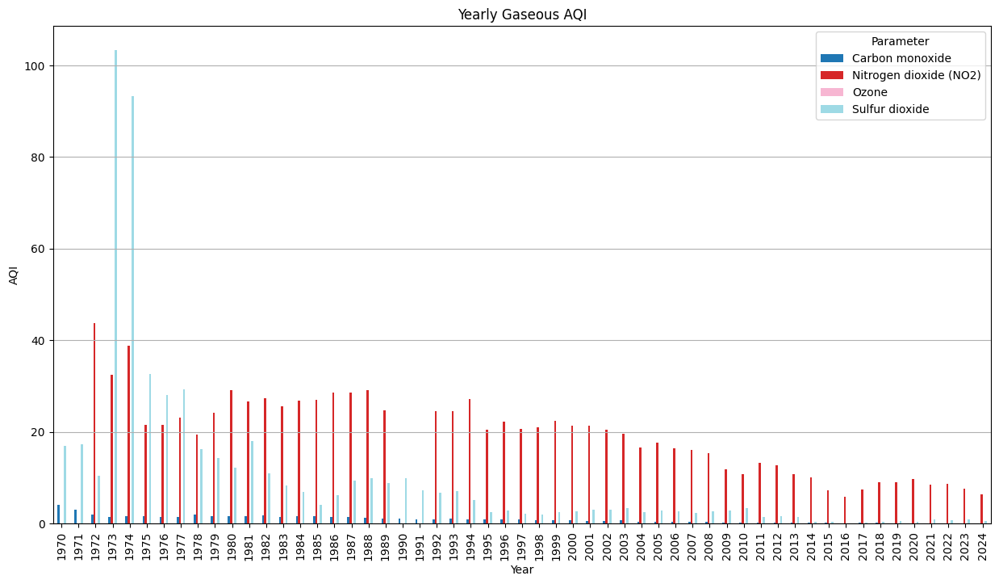

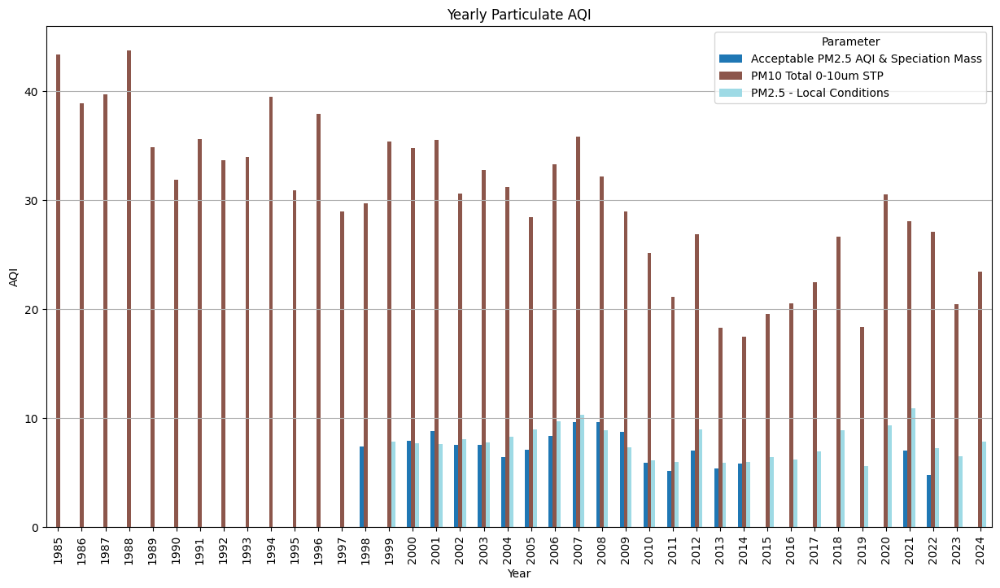

In [107]:
# Try plotting the data
yearly_avg_gas = gas_df_filtered.groupby(['year', 'parameter'])['arithmetic_mean'].mean().unstack()
yearly_avg_gas.plot(kind='bar', figsize=(15, 8), colormap='tab20')
plt.title('Yearly Gaseous AQI')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend(title='Parameter')
plt.grid(axis='y')

yearly_avg_part = part_df_filtered.groupby(['year', 'parameter'])['arithmetic_mean'].mean().unstack()
yearly_avg_part.plot(kind='bar', figsize=(15, 8), colormap='tab20')
plt.title('Yearly Particulate AQI')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend(title='Parameter')
plt.grid(axis='y')

plt.show()